# Geographically Weighted Regression (GWR): 
Dependent Variable = HBP

A geographically weighted regression (GWR) was run including **PM2.5 Air Quality (`AIRQUALTY_MEAN`), Fair Or Poor Health (`GHLTH_AdjPrev`), 'Sleep (`SLEEP_AdjPrev`) and **Food Insecurity (`FoodInsecurity`)** as Independent Variables. These where chosen both because of potential explaintory power and to minimize multicullinearity. 

*(GWR is a spatial regression approach that accounts for geographic variability, producing area-specific regression results and allowing for the creation of a localized nitrogen health risk landscape.)*

In [1]:
pip install pysal==2.0.0

     |████████████████████████████████| 25.0MB 4.1MB/s eta 0:00:01
  Created wheel for pysal: filename=pysal-2.0.0-cp37-none-any.whl size=25231751 sha256=9bac07515a63c9886a8ad7290d9e04ccb69a854563b47371b3e2b71b1be83bd9
  Stored in directory: /home/nelsonce/.cache/pip/wheels/ca/b9/69/49a64348ddb1feaf76b426c81c1db7275cfabacd8bf4ccd778
Successfully built pysal
Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install mgwr

     |████████████████████████████████| 51kB 3.4MB/s eta 0:00:011
     |████████████████████████████████| 225kB 7.3MB/s eta 0:00:01
     |████████████████████████████████| 2.4MB 55.6MB/s eta 0:00:01
     |████████████████████████████████| 23.0MB 57.2MB/s eta 0:00:01
     |████████████████████████████████| 307kB 63.1MB/s eta 0:00:01
  Created wheel for spglm: filename=spglm-1.0.8-cp37-none-any.whl size=38807 sha256=39a01784a8d676fb569a19df5f8c996be0f77a3f331f4ac98ae447bd07c26202
  Stored in directory: /home/nelsonce/.cache/pip/wheels/cd/1e/e3/c68bde79087fdc97cf65ec86e6d1d7ed2171e1baa1b0482363
Successfully built spglm
  Found existing installation: scikit-learn 0.20.3
    Uninstalling scikit-learn-0.20.3:
      Successfully uninstalled scikit-learn-0.20.3
Note: you may need to restart the kernel to use updated packages.


In [3]:
import geopandas as gpd
import seaborn as sbn
import pandas as pd
import numpy as np
import pysal
import libpysal as ps
from mgwr.gwr import GWR, MGWR
from mgwr.sel_bw import Sel_BW
from mgwr.utils import compare_surfaces, truncate_colormap
from mgwr.utils import shift_colormap
import matplotlib.pyplot as plt
import matplotlib as mpl
from shapely.geometry import Polygon
from pysal.lib import cg as geometry
from pysal.lib import weights
import statistics

## Prepping Dataset

In [4]:
df = gpd.read_file('fipsmerge_geo.shp')

pd.set_option("max_columns", None)
pd.set_option("max_rows", None)

df.head(2)

,FIPS,STATE_NAME,COUNTY,STATE_ABBR,ACCESS2_Ad,ARTHRITIS_,BINGE_AdjP,BPHIGH_Adj,BPMED_AdjP,CANCER_Adj,CASTHMA_Ad,CERVICAL_A,CHD_AdjPre,CHECKUP_Ad,CHOLSCREEN,COLON_SCRE,COPD_AdjPr,COREM_AdjP,COREW_AdjP,CSMOKING_A,DENTAL_Adj,DEPRESSION,DIABETES_A,GHLTH_AdjP,HIGHCHOL_A,KIDNEY_Adj,LPA_AdjPre,MAMMOUSE_A,MHLTH_AdjP,OBESITY_Ad,PHLTH_AdjP,SLEEP_AdjP,STROKE_Adj,TEETHLOST_,HEARING_Ad,VISION_Adj,COGNITION_,MOBILITY_A,SELFCARE_A,INDEPLIVE_,DISABILITY,COUNTY_NAM,SchoolSegr,ChildcareC,Dentists,HighSchool,SomeColleg,Unemployme,ChildrenIn,IncomeIneq,ChildrenSi,AirPolluti,DrinkingWa,DrivingAlo,LongCommut,Disconnect,GenderPayG,MedianHHIn,ChildrenFr,Residentia,Homeowners,SevereHous,BroadbandA,Population,AgeBelow18,Age65Older,Black,AmericanIn,Asian,NativeHawa,Hispanic,White,NotProfici,Female,PrematureD,PoorFairHe,PoorPhysic,PoorMental,LowBirthwe,AdultSmoki,AdultObesi,FoodEnviro,PhysicalIn,AccesstoEx,ExcessiveD,AlcoholImp,STI,TeenBirths,Uninsured,PrimaryCar,Preventabl,Mammograph,FluVaccina,SocialAsso,InjuryDeat,AirPollu_1,HHighHousi,HHwOvercro,HHwLackKit,LifeExpect,PrematureA,ChildMorta,InfantMort,FrequentPh,DiabetesPr,HIVPrevale,FoodInsecu,DrugOverdo,UninsuredA,UninsuredC,HighScho_1,ChildrenEl,Resident_1,ChildCar_1,Homicides,Suicides,FirearmFat,MotorVehic,JuvenileAr,FormalJuve,InformalJu,Rural,AIRQUALTY_,geometry
0,01001,Alabama,Autauga,AL,10.4,28.2,15.5,37.2,65.3,6.3,10.2,84.3,5.7,76.0,85.1,71.5,6.8,44.0,41.3,16.9,62.9,22.7,10.7,17.3,32.1,2.9,29.1,74.8,18.0,38.9,11.7,37.5,3.0,12.7,6.0,4.7,14.3,14.7,3.7,8.2,30.2,Autauga County,0.055262,0.175268,0.000322,0.895845,0.596126,0.028169,0.161,4.79440,0.267662,10.0,0.0,0.864011,0.416,NaN,0.684511,66444,0.412507,32.707131,0.742451,0.127533,0.854639,59095,0.234064,0.160487,0.207310,0.004586,0.012031,0.001185,0.033268,0.724545,0.002312,0.513783,9407.948438,0.173,3.910265,5.703204,0.098713,0.169,0.389,6.7,0.291,0.544920,0.152378,0.290909,577.0,20.908880,0.100186,0.000440,3915.0,0.40,0.37,12.691429,68.033478,10.0,0.132084,0.016002,0.015770,75.263497,472.283923,58.562128,6.834686,0.117,0.107,218.0,0.133,9.350765,0.124074,0.040412,0.870000,0.279986,29.382404,5.726341,6.616163,17.457479,17.362711,18.067215,4.838710,24.0,6.0,0.406768,8.535348,"POLYGON ((-86.82067 32.34731, -86.81446 32.370..."
1,01003,Alabama,Baldwin,AL,9.5,26.4,17.8,32.7,62.8,6.3,9.9,85.3,5.5,72.6,85.2,71.5,6.5,55.8,40.8,15.0,65.5,23.2,9.8,15.2,31.9,2.7,27.6,75.4,17.3,37.2,11.0,35.1,2.7,9.9,6.0,4.0,13.3,13.2,3.1,7.2,29.1,Baldwin County,0.090175,0.171167,0.000476,0.910142,0.661050,0.029630,0.164,4.30071,0.186992,7.6,1.0,0.814019,0.376,0.078527,0.740877,65658,0.463740,38.482766,0.771212,0.109629,0.878564,239294,0.212183,0.214698,0.083679,0.008003,0.011225,0.000685,0.048417,0.831488,0.007597,0.513477,8981.575353,0.152,3.730943,5.373666,0.081243,0.150,0.372,7.5,0.276,0.631293,0.164226,0.361446,317.6,20.202237,0.109971,0.000627,2799.0,0.44,0.42,9.653397,77.507985,7.6,0.105648,0.015230,0.006366,76.738314,416.218912,54.035005,5.329250,0.110,0.098,174.3,0.118,25.729422,0.133762,0.049369,0.886517,0.369956,39.543961,6.231824,3.388203,18.790126,14.343432,15.833332,20.305677,343.0,122.0,0.375865,8.263533,"POLYGON ((-87.97309 31.16482, -87.93710 31.173..."


### Filter 

to selected variables: **PM2.5 Air Quality (`AIRQUALTY_MEAN`), Fair Or Poor Health (`GHLTH_AdjPrev`), 'Sleep (`SLEEP_AdjPrev`) and **Food Insecurity (`FoodInsecurity`)**

In [5]:
# Target area (drop florida missing rows)
df = df.drop(df[df['STATE_NAME'] == 'Florida'].index)

#selected variables
df_sf = df[['FIPS','STATE_NAME','STATE_ABBR','COUNTY','COUNTY_NAM', 'AIRQUALTY_',
            'FoodInsecu','SLEEP_AdjP','GHLTH_AdjP','BPHIGH_Adj','geometry']]

In [6]:
#checking for missing values
df_sf.isna().sum()

FIPS          0
STATE_NAME    0
STATE_ABBR    0
COUNTY        0
COUNTY_NAM    0
AIRQUALTY_    8
FoodInsecu    0
SLEEP_AdjP    0
GHLTH_AdjP    0
BPHIGH_Adj    0
geometry      0
dtype: int64

In [7]:
#county count
len(df_sf)

3041

In [8]:
# drop rows with missing values
df_sf = df_sf.dropna()

#county count
len(df_sf)

3033

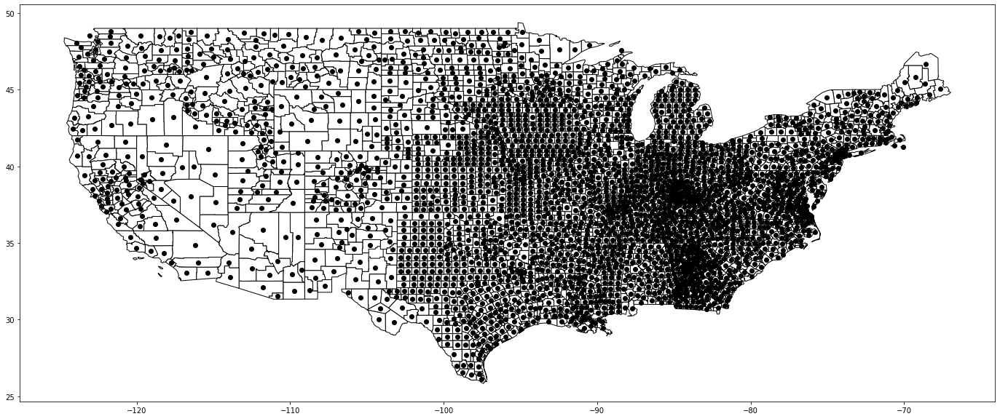

In [9]:
# generate plot of contiguous US counties
fig, ax = plt.subplots(figsize = (24, 30))
df_sf.plot(ax=ax, **{"edgecolor": "black", "facecolor": "white"})
df_sf.centroid.plot(ax = ax, c = "black")
plt.show()

### Adding Centroids

In [10]:
# Adding centroids to county locations so that inter-county distances can be computed within the GWR routine
df_sf["c"] = df_sf.centroid.astype('str')

# Splitting 'c' column
df_sf[['point', 'Point_X','Point_Y']] = df_sf['c'].str.split(' ', 2, expand=True)


df_sf['Point_X'] = df_sf['Point_X'].str.replace(r'[()]',"").astype('float').round()
df_sf['Point_Y'] = df_sf['Point_Y'].str.replace(r'[()]',"").astype('float').round()

#drop a couple of columns
df_sf = df_sf.drop(columns = ['c','point'])

In [11]:
df_sf.head(2)

,FIPS,STATE_NAME,STATE_ABBR,COUNTY,COUNTY_NAM,AIRQUALTY_,FoodInsecu,SLEEP_AdjP,GHLTH_AdjP,BPHIGH_Adj,geometry,Point_X,Point_Y
0,01001,Alabama,AL,Autauga,Autauga County,8.535348,0.133,37.5,17.3,37.2,"POLYGON ((-86.82067 32.34731, -86.81446 32.370...",-87.0,33.0
1,01003,Alabama,AL,Baldwin,Baldwin County,8.263533,0.118,35.1,15.2,32.7,"POLYGON ((-87.97309 31.16482, -87.93710 31.173...",-88.0,31.0


### Preparing HBP dataset inputs

In [12]:
#Prepare HBP dataset inputs

sf_y = df_sf['BPHIGH_Adj'].values.reshape((-1, 1))
sf_X = df_sf[['AIRQUALTY_','FoodInsecu','SLEEP_AdjP','GHLTH_AdjP']].values
u = df_sf["Point_X"]
v = df_sf["Point_Y"]
sf_coords = list(zip(u, v))

### Standardizing the Variables

In order to compare each of the bandwidths obtained from an MGWR model, it is necessary to standardize the dependent and independent variables so that they are centered at zero and based on the same range of variation. Otherwise it may be difficult to objectively compare the estimated bandwidths because it is possible that they are also representative of the scale and variation of the independent variables.

In [13]:
#Standardize variables 

sf_X = (sf_X - sf_X.mean(axis = 0)) / sf_X.std(axis = 0)
sf_y = (sf_y - sf_y.mean(axis = 0)) / sf_y.std(axis = 0)

## Geographically Weighted Regression (GWR): 
Dependent Variable = HBP

In [14]:
#Calibrate GWR model

gwr_selector = Sel_BW(sf_coords, sf_y, sf_X)
gwr_bw = gwr_selector.search(bw_min=2)
print(gwr_bw)

gwr_results = GWR(sf_coords, sf_y, sf_X, gwr_bw, kernel='gaussian').fit()

106.0


In [15]:
gwr_results.summary()

Model type                                                         Gaussian
Number of observations:                                                3033
Number of covariates:                                                     5

Global Regression Results
---------------------------------------------------------------------------
Residual sum of squares:                                            674.210
Log-likelihood:                                                   -2023.179
AIC:                                                               4056.358
AICc:                                                              4058.385
BIC:                                                             -23602.198
R2:                                                                   0.778
Adj. R2:                                                              0.777

Variable                              Est.         SE  t(Est/SE)    p-value
------------------------------- ---------- ---------- ------

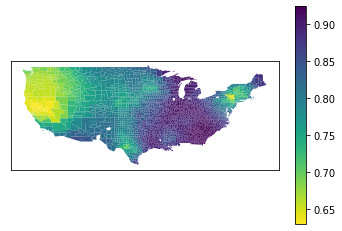

In [16]:
#Local model fit
>>> df_sf["R2"] = gwr_results.localR2
>>> df_sf.plot("R2", 
                   legend = True, 
                   cmap='viridis_r')
>>> ax = plt.gca() 
>>> ax.get_xaxis().set_visible(False)
>>> ax.get_yaxis().set_visible(False)
#>>> plt.savefig("local_R2")
>>> plt.show()

## Parameter Estimates for each Parameter

params 
<br>[:,1] = Air Quality, 
<br>[:,2] = Food Inscurity, 
<br>[:,3] = Sleep, 
<br>[;,4] = General Health

In [17]:
#Prepare GWR results for mapping

#Add GWR parameters to GeoDataframe
df_sf['gwr_intercept'] = gwr_results.params[:,0] #X0 - intercept
df_sf['gwr_airquality'] = gwr_results.params[:,1] #X1 - Air quality parameter estimates
df_sf['gwr_fi'] = gwr_results.params[:,2] #X2 - food insecurity parameter estimates
df_sf['gwr_sleep'] = gwr_results.params[:,3] #X3 - Sleep 
df_sf['gwr_ghealth'] = gwr_results.params[:,4] #X4 - General (Fair and Poor) Health


#Obtain t-vals filtered based on multiple testing correction
gwr_filtered_t = gwr_results.filter_tvals()

In [18]:
aq = statistics.mean(abs(df_sf['gwr_airquality']))
fi = statistics.mean(abs(df_sf['gwr_fi']))
slp = statistics.mean(abs(df_sf['gwr_sleep']))
gh = statistics.mean(abs(df_sf['gwr_ghealth']))


print('Air Quality:',aq, '\nFood Insecurity:',fi, '\nSleep:',slp, '\nGeneral Health:',gh, )

Air Quality: 0.07973660743880835 
Food Insecurity: 0.09194227343639708 
Sleep: 0.1818230557430949 
General Health: 0.5975472748725164


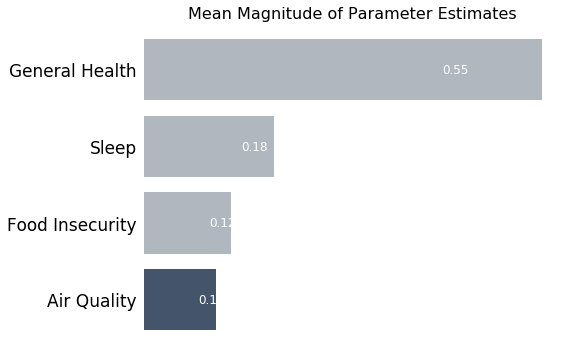

In [19]:
## Feature Importance, average magnitude from parameter estimates

# feature names and Mean Magnitude of Parameter Estimates
features = ['Air Quality', 'Food Insecurity','Sleep','General Health']
magnitude = [.1, .12, .18, .55]

# create figure and axis objects
fig, ax = plt.subplots(figsize=(8, 5))

# plot horizontal bars
bars = ax.barh(features, magnitude, color=['#b0b7bf' if x != 0.1 else '#44546A' for x in magnitude])

    
# Add text labels inside bars
for bar in bars:
    xval = bar.get_width()
    ax.text(xval*.75, bar.get_y() + bar.get_height()/2., str(xval), va='center', color='white', fontsize=12)


# set axis labels and title
ax.set_title('Mean Magnitude of Parameter Estimates', fontsize=16)

# remove spines and ticks
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(top=False, right=False)
ax.tick_params(left=False, bottom=False)

# Remove x-ticks and labels
ax.set_xticks([])
ax.yaxis.set_tick_params(labelsize=17)

# adjust layout
plt.tight_layout()

#Save figure
#plt.savefig("featureimportance")

# show plot
plt.show()

## Testing Assumptions

### Local Multicollinearity

Though there are many tools available to evaluate multicollinearity amongst explanatory variables for traditional regression models, some extra care is needed for local models that borrow data from nearby locations. Within each local model, there may be higher levels of collinearity than is present in the dataset as a whole. Higher levels of collinearity are associated with problems such as estimate instability, unintuitive parameter signs, high R2
 diagnostics despite few or no significant parameters, and inflated standard errors for parameter estimates. As a result, diagnostic tools have been designed to detect levels of local multicollinearity, including local Correlation Coefficients (CC), local Variation Inflation Factors (VIF), local Condition Number (CN), and local Variation Decomposition Proportions (VDP).
 
Here we are using VIF. Each local measure has a rule of thumb that indicates that there might be an issue due to multicollinearity: VIF higher than 10 indicate multicollinearity in some measure. However, these rules are not absolute and obtaining lower values does not mean collinearity is innocuous, nor does obtaining larger values guarantee collinearity is indeed problematic. In addition, local VIF’s do not consider the local intercept term. The maps generated below demonstrate local VIF’s.

**The VIF's are all well below 10 indicating that that collinearity is not problemicatic for any of the calibration locations.** 

In addition, it has been demonstrated that multicollinearity is not inherently more problematic in GWR than a traditional regression and some of the patterns theorized to be associated with multicollinearity may be indicative of reality or due to scale misspecification.


VIF for multicollinearity
<br>[:,0] = Air Quality, 
<br>[:,1] = Food  Inscurity, 
<br>[:,2] = Sleep, 
<br>[;,3] = Health

'AIRQUALTY_','FoodInsecu','SLEEP_AdjP','GHLTH_AdjP'

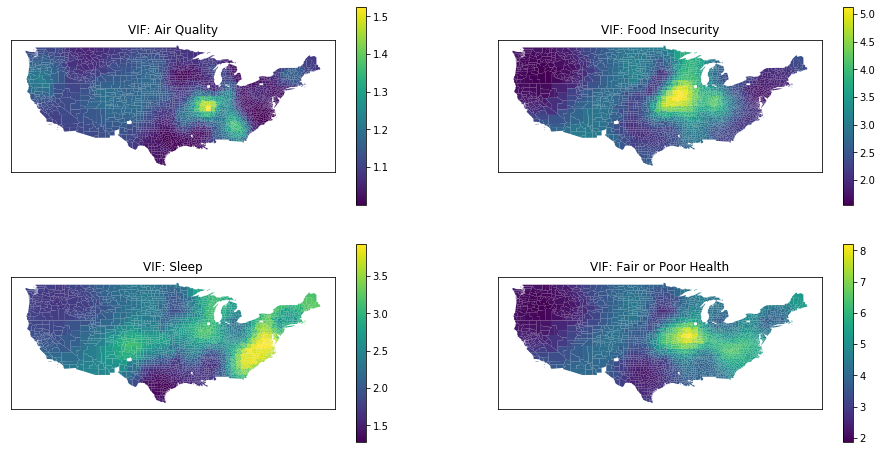

In [20]:

# Local Multicollinearity
LCC, VIF, CN, VDP = gwr_results.local_collinearity()


df_sf["vif_airquality"] = VIF[:, 0]
df_sf["vif_foodins"] = VIF[:, 1]
df_sf["vif_sleep"] = VIF[:, 2]
df_sf["vif_health"] = VIF[:, 3]


fig, ax = plt.subplots(2, 2, figsize = (16, 8))
df_sf["vif"] = VIF[:, 0]
df_sf.plot("vif", ax = ax[0,0], legend = True)
ax[0,0].set_title("VIF: " + 'Air Quality')
ax[0,0].get_xaxis().set_visible(False)
ax[0,0].get_yaxis().set_visible(False)

df_sf["vif"] = VIF[:, 1]
df_sf.plot("vif", ax = ax[0,1], legend = True)
ax[0,1].set_title("VIF: " + 'Food Insecurity')
ax[0,1].get_xaxis().set_visible(False)
ax[0,1].get_yaxis().set_visible(False)

df_sf["vif"] = VIF[:, 2]
df_sf.plot("vif", ax = ax[1,0], legend = True)
ax[1,0].set_title("VIF: " + 'Sleep')
ax[1,0].get_xaxis().set_visible(False)
ax[1,0].get_yaxis().set_visible(False)


df_sf["vif"] = VIF[:, 3]
df_sf.plot("vif", ax = ax[1,1], legend = True)
ax[1,1].set_title("VIF: " + 'Fair or Poor Health')
ax[1,1].get_xaxis().set_visible(False)
ax[1,1].get_yaxis().set_visible(False)

### Inference on Individual Parameter Estimates

As with GWR, it is necessary to apply the modified hypothesis testing framework described above. However, in the case of MGWR, it is possible to extend the testing framework to formulate a covariate-specific corrected hypothesis test for each surface of parameter estimates. This novel methodology is described in [7] and the necessary functionality is not currently available in other software implementations other than mgwr. 

In MGWR, the hat matrix, S, that maps the observed dependent variable onto the fitted values of the dependent variable, can be decomposed into covariate-specific contributions, Rj. With this, it is possible to compute a distinct measure of the effective number of parameters (ENP) for each parameter surface.

The default behavior in mgwr is to use αj to compute a covariate-specific critical t-value for hypothesis testing. It is possible to inspect each ENPj, αj, and the adjusted t-values as follows:

## Intercept

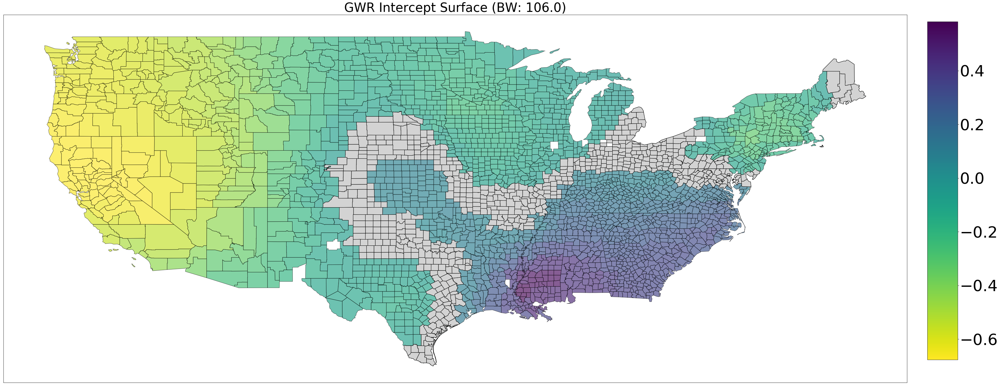

In [21]:
#Maps of GWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(figsize=(45,20))
ax.set_title('GWR Intercept Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color map
cmap = plt.cm.viridis_r

#Find min and max values of the two combined datasets
gwr_min = df_sf['gwr_intercept'].min()
gwr_max = df_sf['gwr_intercept'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_sf.plot('gwr_intercept', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,0] == 0).any():
    df_sf[gwr_filtered_t[:,0] == 0].plot(color='lightgrey', ax=ax, **{'edgecolor':'black'})

#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()

## Air Quality

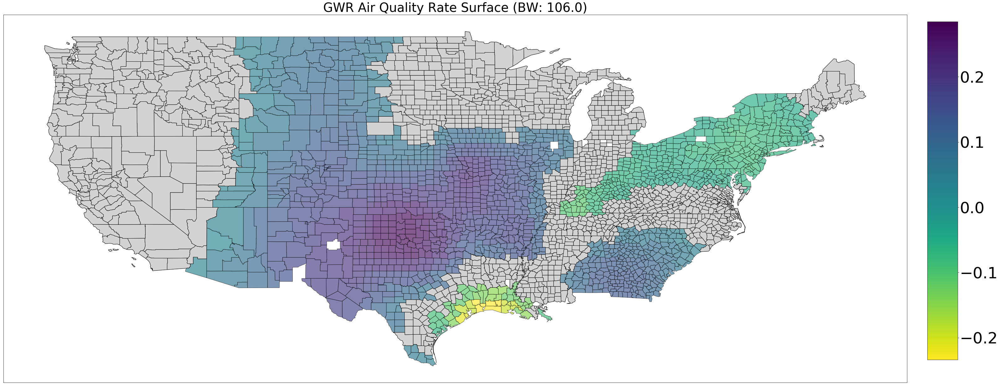

In [22]:
#Maps of GWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(figsize=(45,20))
ax.set_title('GWR Air Quality Rate Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color map
cmap = plt.cm.viridis_r

#Find min and max values of the two combined datasets
gwr_min = df_sf['gwr_airquality'].min()
gwr_max = df_sf['gwr_airquality'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_sf.plot('gwr_airquality', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,1] == 0).any():
    df_sf[gwr_filtered_t[:,1] == 0].plot(color='lightgrey', ax=ax, **{'edgecolor':'black'})

#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()

## Food Insecurity

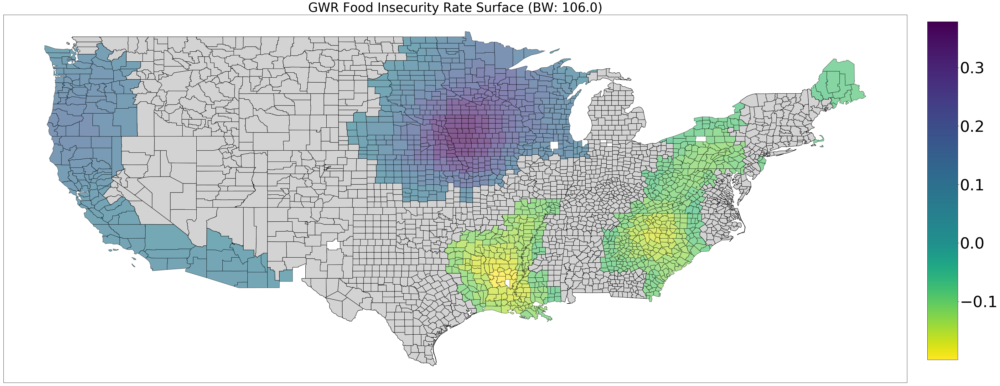

In [23]:
#Maps of GWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(figsize=(45,20))
ax.set_title('GWR Food Insecurity Rate Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color map
cmap = plt.cm.viridis_r

#Find min and max values of the two combined datasets
gwr_min = df_sf['gwr_fi'].min()
gwr_max = df_sf['gwr_fi'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_sf.plot('gwr_fi', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,2] == 0).any():
    df_sf[gwr_filtered_t[:,2] == 0].plot(color='lightgrey', ax=ax, **{'edgecolor':'black'})

#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()

## Sleep

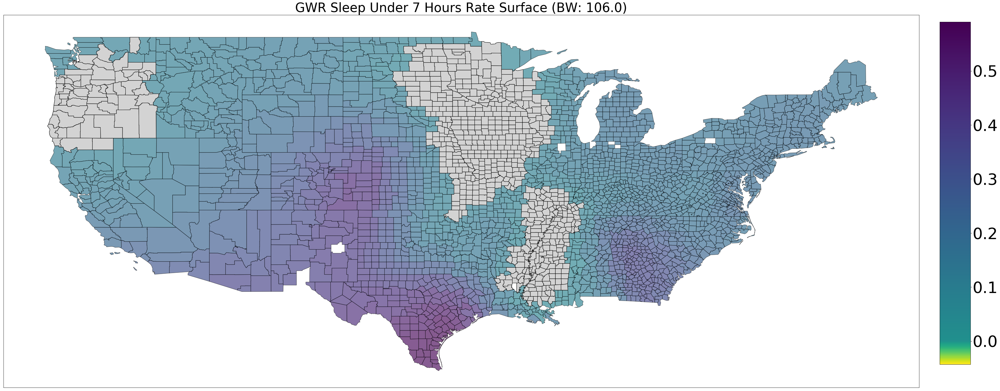

In [24]:
#Maps of GWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(figsize=(45,20))
ax.set_title('GWR Sleep Under 7 Hours Rate Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color map
cmap = plt.cm.viridis_r

#Find min and max values of the two combined datasets
gwr_min = df_sf['gwr_sleep'].min()
gwr_max = df_sf['gwr_sleep'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_sf.plot('gwr_sleep', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,3] == 0).any():
    df_sf[gwr_filtered_t[:,3] == 0].plot(color='lightgrey', ax=ax, **{'edgecolor':'black'})

#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()

## General Health (Fair or Poor Health)

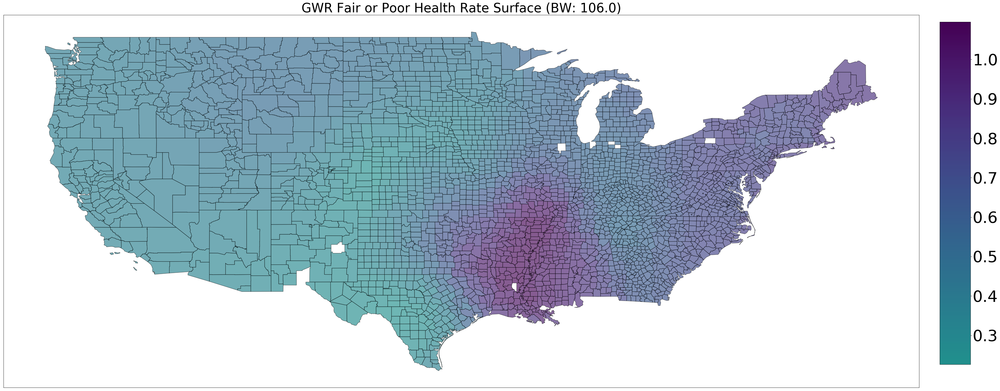

In [25]:
#Maps of GWR parameter surfaces where the grey units pertain to statistically insignificant parameters

#Prep plot and add axes
fig, ax = plt.subplots(figsize=(45,20))
ax.set_title('GWR Fair or Poor Health Rate Surface (BW: ' + str(gwr_bw) +')', fontsize=40)

#Set color map
cmap = plt.cm.viridis_r

#Find min and max values of the two combined datasets
gwr_min = df_sf['gwr_ghealth'].min()
gwr_max = df_sf['gwr_ghealth'].max()
vmin = np.min([gwr_min])
vmax = np.max([gwr_max])

#If all values are negative use the negative half of the colormap
if (vmin < 0) & (vmax < 0):
    cmap = truncate_colormap(cmap, 0.0, 0.5)
#If all values are positive use the positive half of the colormap
elif (vmin > 0) & (vmax > 0):
    cmap = truncate_colormap(cmap, 0.5, 1.0)
#Otherwise, there are positive and negative values so the colormap so zero is the midpoint
else:
    cmap = shift_colormap(cmap, start=0.0, midpoint=1 - vmax/(vmax + abs(vmin)), stop=1.)

#Create scalar mappable for colorbar and stretch colormap across range of data values
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))

#Plot GWR parameters
df_sf.plot('gwr_ghealth', cmap=sm.cmap, ax=ax, vmin=vmin, vmax=vmax, **{'edgecolor':'black', 'alpha':.65})
#If there are insignificnt parameters plot gray polygons over them
if (gwr_filtered_t[:,4] == 0).any():
    df_sf[gwr_filtered_t[:,4] == 0].plot(color='lightgrey', ax=ax, **{'edgecolor':'black'})

#Set figure options and plot 
fig.tight_layout()    
fig.subplots_adjust(right=0.9)
cax = fig.add_axes([0.92, 0.14, 0.03, 0.75])
sm._A = []
cbar = fig.colorbar(sm, cax=cax)
cbar.ax.tick_params(labelsize=50) 
ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.show()

In [26]:
# Convert GeoPandas DataFrame to regular pandas DataFrame
df_e = pd.DataFrame(df_sf)

df_e = df_e.drop('geometry', axis=1)

df_e['zero_aq'] = gwr_filtered_t[:,1] #X1 - Air Quality filtered t-vals

#If there are insignificnt parameters make them 0 instead of the parameter estimate

df_e['gwr_aq_sig'] = np.where(
    df_e['zero_aq'] == 0.0,
    0,
    df_e['gwr_airquality']
)

df_e

,FIPS,STATE_NAME,STATE_ABBR,COUNTY,COUNTY_NAM,AIRQUALTY_,FoodInsecu,SLEEP_AdjP,GHLTH_AdjP,BPHIGH_Adj,Point_X,Point_Y,R2,gwr_intercept,gwr_airquality,gwr_fi,gwr_sleep,gwr_ghealth,vif_airquality,vif_foodins,vif_sleep,vif_health,vif,zero_aq,gwr_aq_sig
0,01001,Alabama,AL,Autauga,Autauga County,8.535348,0.133,37.5,17.3,37.2,-87.0,33.0,0.892029,0.413074,0.106794,-0.036575,0.133411,0.859986,1.173999,2.843390,1.835230,3.814681,3.814681,3.446070,0.106794
1,01003,Alabama,AL,Baldwin,Baldwin County,8.263533,0.118,35.1,15.2,32.7,-88.0,31.0,0.883074,0.468955,0.076709,-0.052795,0.089250,0.913046,1.110746,2.916926,1.765647,3.922572,3.922572,0.000000,0.000000
2,01005,Alabama,AL,Barbour,Barbour County,8.978495,0.178,43.9,27.3,44.3,-85.0,32.0,0.911437,0.386568,0.137338,-0.069931,0.273945,0.706132,1.233949,2.399025,2.527461,4.085820,4.085820,4.585384,0.137338
3,01007,Alabama,AL,Bibb,Bibb County,8.875465,0.149,40.0,22.0,39.6,-87.0,33.0,0.892029,0.413074,0.106794,-0.036575,0.133411,0.859986,1.173999,2.843390,1.835230,3.814681,3.814681,3.446070,0.106794
4,01009,Alabama,AL,Blount,Blount County,9.062862,0.137,37.3,18.6,35.2,-87.0,34.0,0.896442,0.341255,0.060616,-0.034500,0.152361,0.821778,1.183120,2.973293,1.862183,3.958168,3.958168,0.000000,0.000000
5,01011,Alabama,AL,Bullock,Bullock County,8.809776,0.156,46.0,30.7,48.9,-86.0,32.0,0.900574,0.437956,0.131183,-0.051113,0.186782,0.797770,1.197253,2.535570,2.142671,3.833798,3.833798,4.116685,0.131183
6,01013,Alabama,AL,Butler,Butler County,8.419869,0.138,40.9,23.4,42.0,-87.0,32.0,0.895528,0.421476,0.100425,-0.040458,0.127496,0.863398,1.156171,2.902946,1.894644,4.019532,4.019532,4.070417,0.100425
7,01015,Alabama,AL,Calhoun,Calhoun County,8.372677,0.156,38.1,20.8,38.4,-86.0,34.0,0.904770,0.321697,0.074804,-0.064544,0.237726,0.714812,1.221892,2.842751,2.160562,4.145293,4.145293,3.074084,0.074804
8,01017,Alabama,AL,Chambers,Chambers County,8.564352,0.133,43.4,22.0,40.6,-85.0,33.0,0.915015,0.343594,0.128796,-0.088566,0.321090,0.657018,1.288176,2.501532,2.642763,4.280845,4.280845,4.403349,0.128796
9,01019,Alabama,AL,Cherokee,Cherokee County,8.275254,0.147,38.2,20.6,36.6,-86.0,34.0,0.904770,0.321697,0.074804,-0.064544,0.237726,0.714812,1.221892,2.842751,2.160562,4.145293,4.145293,3.074084,0.074804


In [27]:
# Exporting data for PowerBI data story
df_e.to_csv('hbp_gwr.csv',index=False)